dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR'])
Shape of data: (1797, 64)


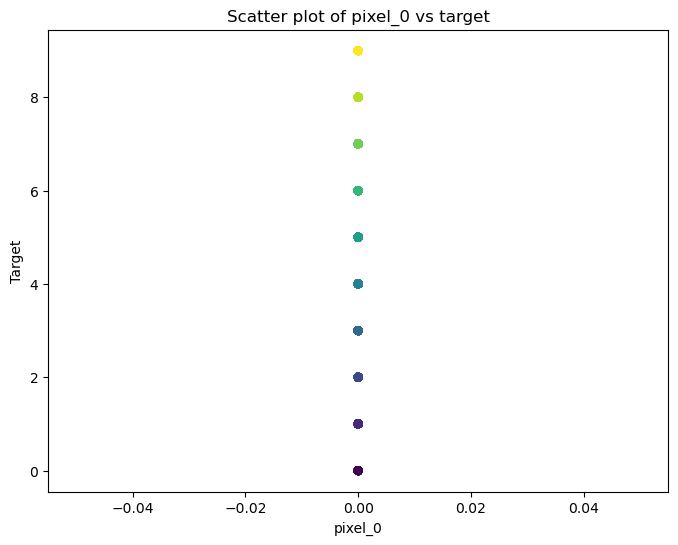

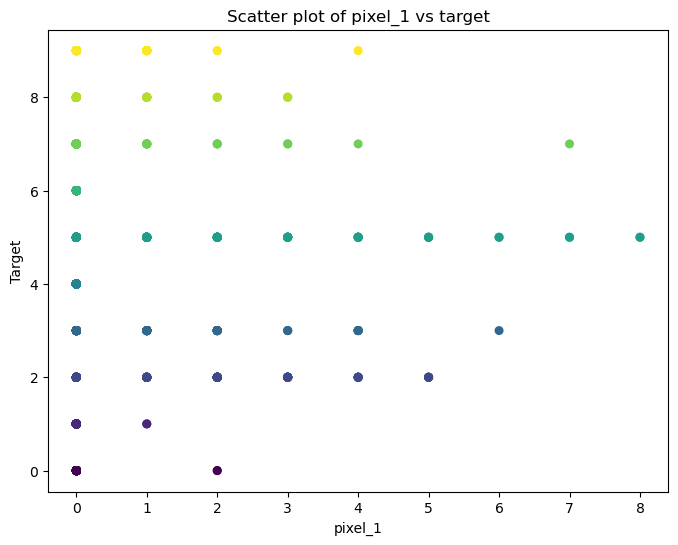

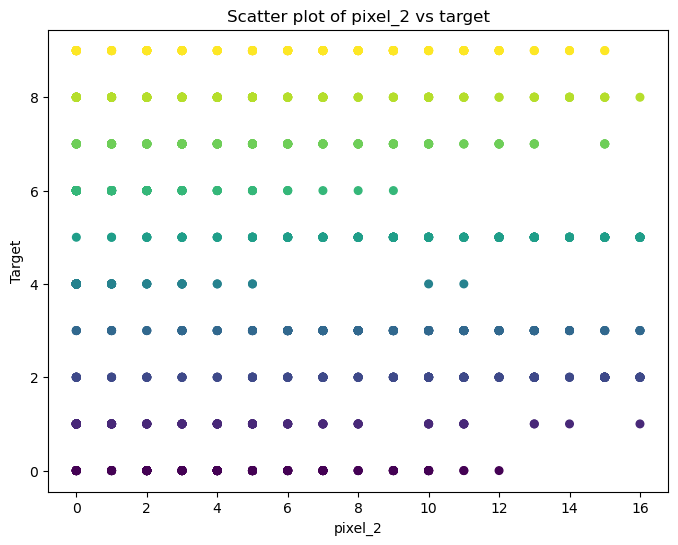

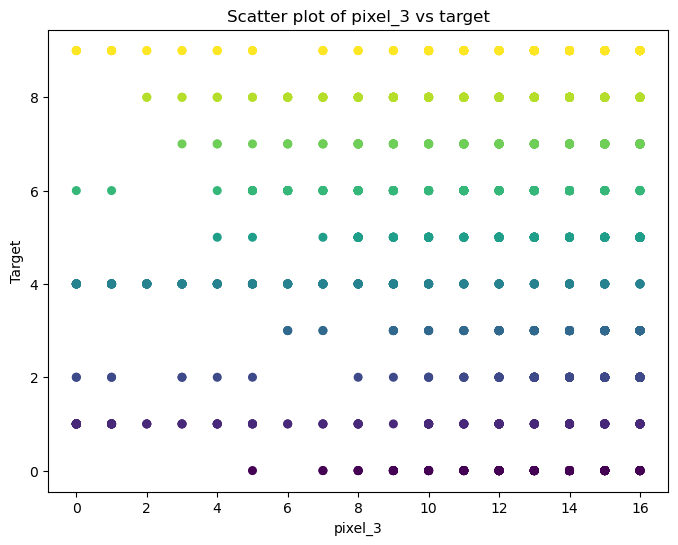

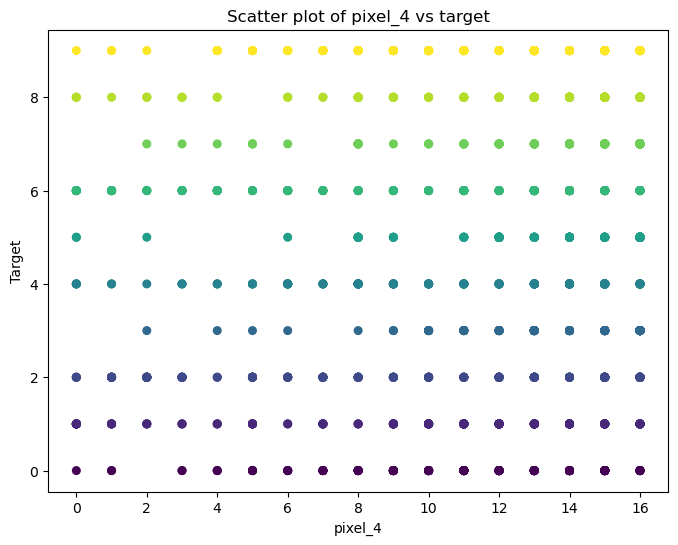

...

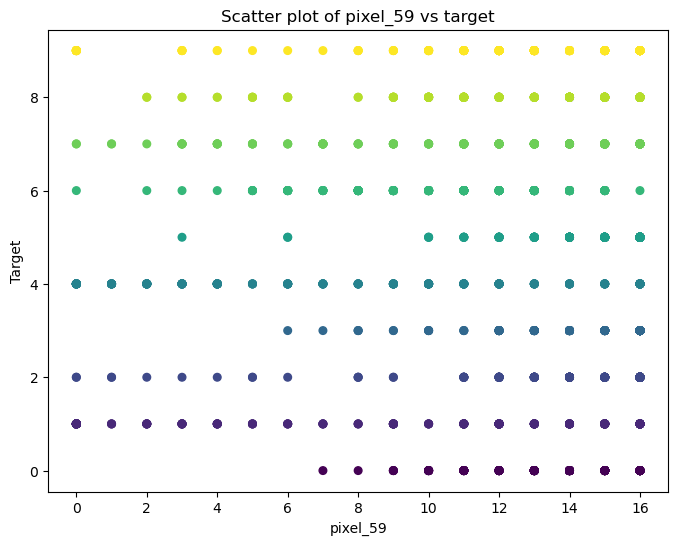

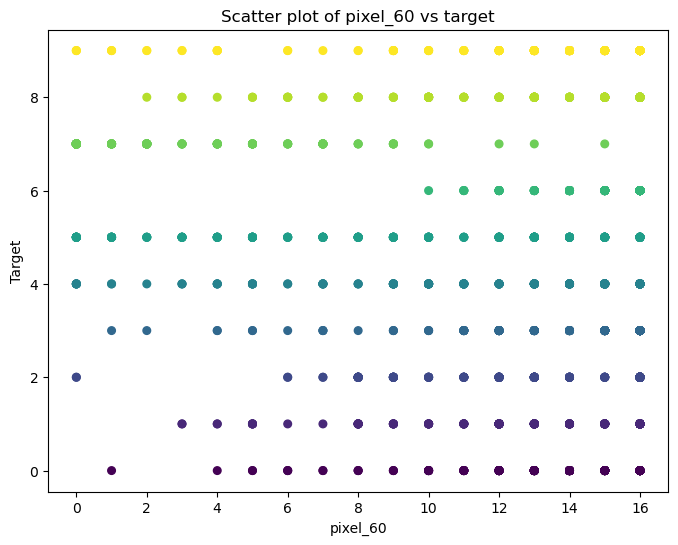

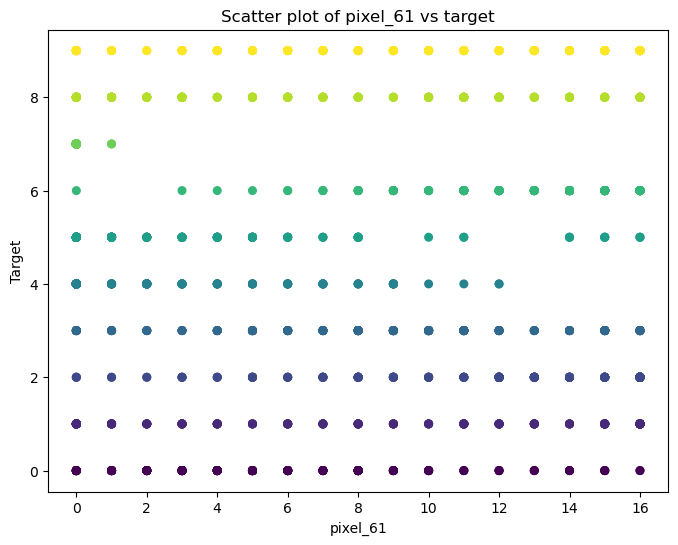

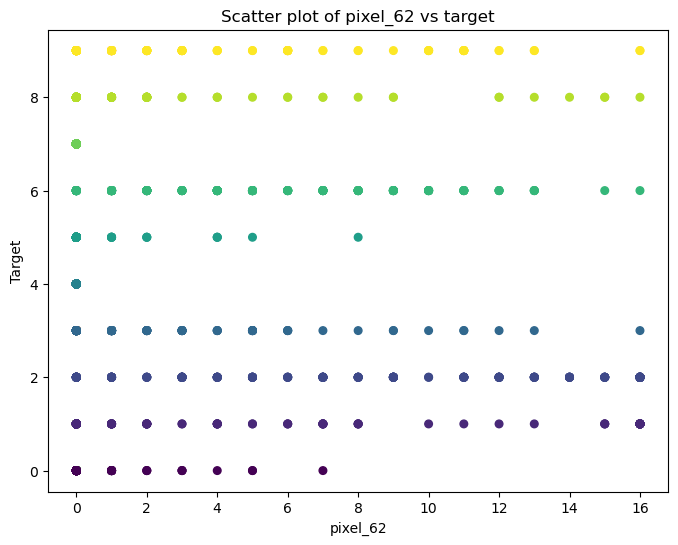

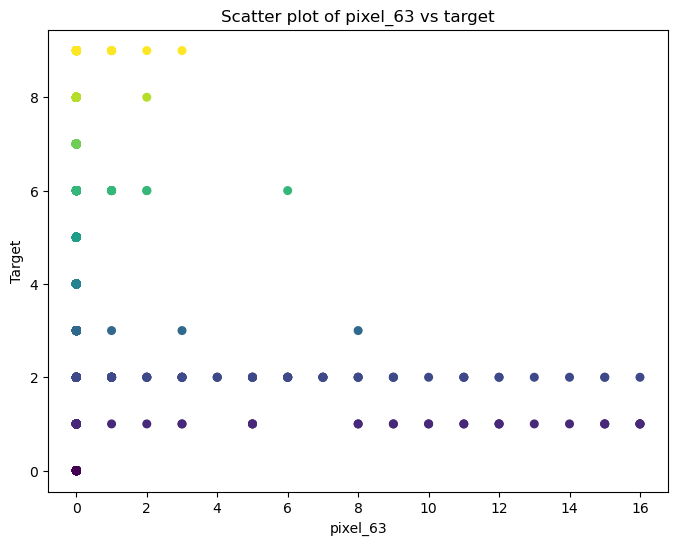

Accuracy without PCA: 0.9722222222222222


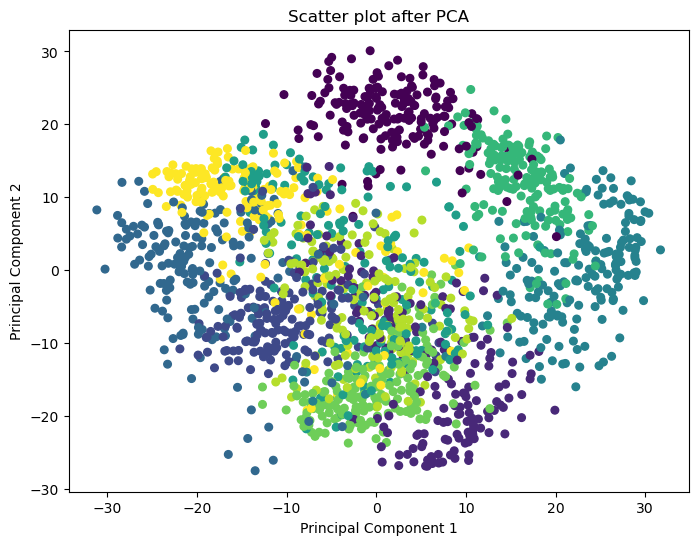

Accuracy with PCA: 0.6083333333333333


In [1]:
# Import necessary libraries
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
dataset = load_digits()

# Display dataset keys
print(dataset.keys())
print("Shape of data:", dataset.data.shape)

# Convert dataset to DataFrame
df = pd.DataFrame(dataset.data, columns=[f'pixel_{i}' for i in range(dataset.data.shape[1])])
df['target'] = dataset.target

# Visualize data points
for feature in df.columns[:-1]:
    plt.figure(figsize=(8, 6))
    plt.scatter(df[feature], df['target'], c=df['target'], cmap='viridis', marker='o', s=30)
    plt.title(f'Scatter plot of {feature} vs target')
    plt.xlabel(feature)
    plt.ylabel('Target')
    plt.show()

# Prepare data for modeling
X = df.drop('target', axis=1)
y = df['target']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Logistic Regression without PCA
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
accuracy_without_pca = model.score(X_test, y_test)
print("Accuracy without PCA:", accuracy_without_pca)

# Further reducing dimensions to 2 for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Visualize the data after PCA
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', marker='o', s=30)
plt.title('Scatter plot after PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Split PCA transformed data into training and testing sets
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=30)

# Logistic Regression with PCA
model = LogisticRegression(max_iter=1000)
model.fit(X_train_pca, y_train)
accuracy_with_pca = model.score(X_test_pca, y_test)
print("Accuracy with PCA:", accuracy_with_pca)



Index(['label', 'pixel0', 'pixel1', 'pixel2', 'pixel3', 'pixel4', 'pixel5',
       'pixel6', 'pixel7', 'pixel8',
       ...
       'pixel774', 'pixel775', 'pixel776', 'pixel777', 'pixel778', 'pixel779',
       'pixel780', 'pixel781', 'pixel782', 'pixel783'],
      dtype='object', length=785)
(42000, 785)


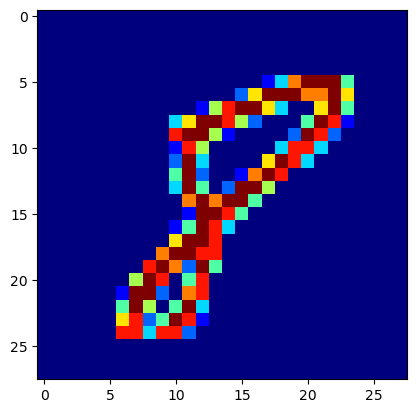

Accuracy: 0.9391666666666667
Accuracy after PCA: 0.9535714285714286


In [9]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('train.csv')

# Check the keys (column names) and shape of the dataframe
print(df.keys())
print(df.shape)

# Display an example image
plt.imshow(df.iloc[18306,1:].values.reshape(28,28), cmap='jet')
plt.show()

# Separate features and target variable
X = df.iloc[:,1:]
y = df.iloc[:,0]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the K-Nearest Neighbors classifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# Make predictions and calculate accuracy
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# PCA for dimensionality reduction
pca = PCA(n_components=100)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

# Train KNN after PCA transformation
knn_pca = KNeighborsClassifier()
knn_pca.fit(X_train_trf, y_train)

# Make predictions after PCA transformation
y_pred_pca = knn_pca.predict(X_test_trf)
accuracy_pca = accuracy_score(y_test, y_pred_pca)
print("Accuracy after PCA:", accuracy_pca)

pca = PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

X_train_trf

# Convert the target variable to string type
y_train_trf = y_train.astype(str)

# Scatter plot
fig = px.scatter(x=X_train_trf[:,0],  # Set x-axis values from the first column of transformed training data
                 y=X_train_trf[:,1],  # Set y-axis values from the second column of transformed training data
                 color=y_train_trf,  # Color points based on the transformed target variable
                 color_discrete_sequence=px.colors.qualitative.G10  # Use the qualitative color palette G10
                )
fig.show()  # Display the figure


In [14]:
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [16]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x=X_train_trf[:, 0],  # Set x-axis values from the first component of transformed training data
                    y=X_train_trf[:, 1],  # Set y-axis values from the second component of transformed training data
                    z=X_train_trf[:, 2],  # Set z-axis values from the third component of transformed training data
                    color=y_train_trf,    # Color points based on the transformed target variable
                    color_discrete_sequence=px.colors.qualitative.G10,  # Use the qualitative color palette G10
                    title="PCA 3D Scatter Plot"
                   )
fig.show()  # Display the figure


In [18]:
pca.explained_variance_
#Eign values

array([1.03682577, 0.98913056])

In [23]:
pca.explained_variance_ratio_
#Eign values 

array([0.26587439, 0.25364385])

In [20]:
pca.components_

array([[-0.83819395,  0.03438944, -0.53461311,  0.10216207],
       [-0.22517633,  0.76107162,  0.30097552, -0.52865806]])

In [22]:
pca.components_.shape
#Eigen vectors

(2, 4)

In [24]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [25]:
pca.components_.shape
#Eigen vectors

(784, 784)

In [26]:
pca.explained_variance_ratio_
#Eign values 

array([5.78519225e-02, 4.14926968e-02, 3.80423901e-02, 2.96626277e-02,
       2.58156168e-02, 2.25498018e-02, 1.97306802e-02, 1.77527998e-02,
       1.56865066e-02, 1.43606328e-02, 1.37025484e-02, 1.22725500e-02,
       1.14691200e-02, 1.12302739e-02, 1.05852885e-02, 1.01993106e-02,
       9.57676152e-03, 9.42708817e-03, 9.12489429e-03, 8.90170190e-03,
       8.39940495e-03, 8.20063196e-03, 7.85303229e-03, 7.56739707e-03,
       7.37261022e-03, 7.01884653e-03, 6.97919728e-03, 6.71104483e-03,
       6.39845030e-03, 6.30337291e-03, 6.15350848e-03, 6.02388659e-03,
       5.83673972e-03, 5.78547759e-03, 5.72333148e-03, 5.46399774e-03,
       5.43207369e-03, 5.28172755e-03, 5.13381744e-03, 4.94015474e-03,
       4.87671103e-03, 4.81978768e-03, 4.68204430e-03, 4.59342487e-03,
       4.57660834e-03, 4.49219022e-03, 4.44682221e-03, 4.41540749e-03,
       4.35111936e-03, 4.32032928e-03, 4.21808870e-03, 4.18243127e-03,
       4.07994349e-03, 4.02004913e-03, 3.98335855e-03, 3.94598812e-03,
      

In [27]:
np.cumsum(pca.explained_variance_ratio_)
#Eign values 

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

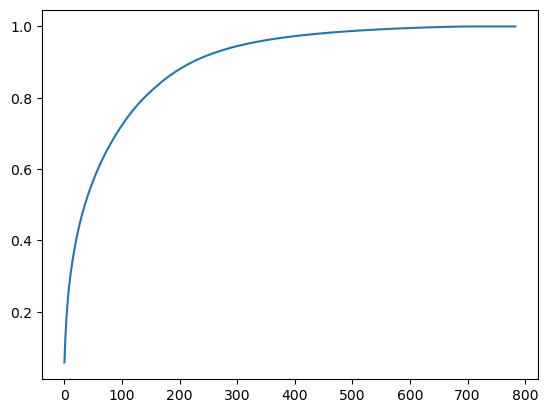

In [30]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

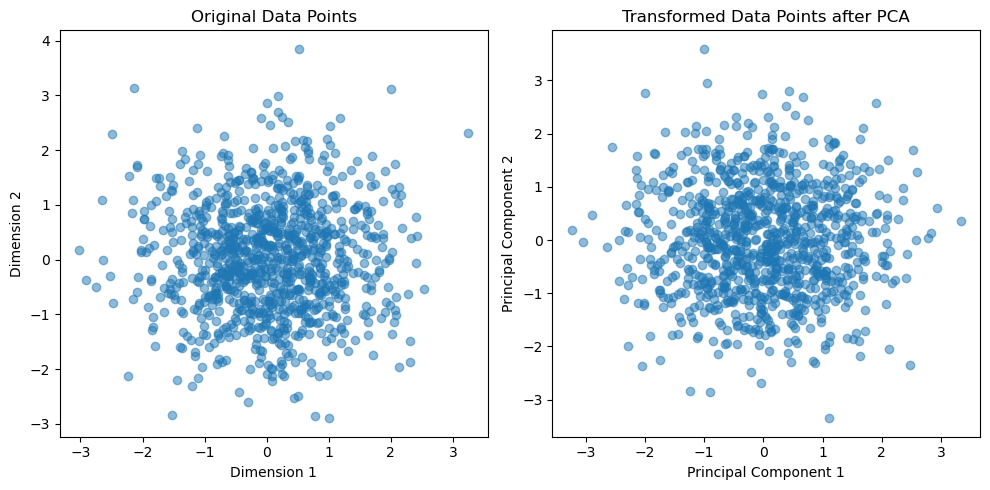

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Step 1: Generate random data points in 4-dimensional space
np.random.seed(42)
data = np.random.randn(1000, 4)

# Step 2: Perform PCA to reduce dimensionality to 2
pca = PCA(n_components=2)
transformed_data = pca.fit_transform(data)

# Step 3: Plot the original and transformed data points
plt.figure(figsize=(10, 5))

# Original data points
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], alpha=0.5)
plt.title('Original Data Points')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

# Transformed data points
plt.subplot(1, 2, 2)
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], alpha=0.5)
plt.title('Transformed Data Points after PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.tight_layout()
plt.show()


In [66]:
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Step 1: Load the MNIST dataset
mnist = fetch_openml('mnist_784', version=1, as_frame=False, parser='auto')

# Separate features and target variable
X = mnist.data
y = mnist.target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=10000, random_state=42)

# Step 2: Perform PCA to reduce dimensionality to 20
pca = PCA(n_components=20)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Step 3: Train the k-Nearest Neighbors model on original data
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Step 4: Evaluate k-Nearest Neighbors on original data
y_pred_knn = knn.predict(X_test)
accuracy_knn = accuracy_score(y_test, y_pred_knn)

# Step 5: Train the k-Nearest Neighbors model on reduced data (PCA)
knn_pca = KNeighborsClassifier(n_neighbors=5)
knn_pca.fit(X_train_pca, y_train)

# Step 6: Evaluate k-Nearest Neighbors on reduced data (PCA)
y_pred_knn_pca = knn_pca.predict(X_test_pca)
accuracy_knn_pca = accuracy_score(y_test, y_pred_knn_pca)

# Step 7: Compare the perfor
# Step 7: Compare the performances
print("Accuracy of k-Nearest Neighbors on original data:", accuracy_knn)
print("Accuracy of k-Nearest Neighbors on reduced data (PCA):", accuracy_knn_pca)

Accuracy of k-Nearest Neighbors on original data: 0.9696
Accuracy of k-Nearest Neighbors on reduced data (PCA): 0.9676
